In [1]:
%cd ..
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1" # use cpu because I'm training on gpu

# from thumbs.experiments.pokemjon_big_both import PokemonExperiment
from thumbs.experiments.wow_gan_2 import MyExperiment
from thumbs.train import load_weights
from thumbs.viz import show_samples, visualize_preprocessed_image
from thumbs.data import load_and_preprocess_image
import tensorflow as  tf
import numpy as np
import matplotlib.pyplot as plt



/home/anthony/workspace/yt-data


/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
exp = MyExperiment()
mparams = exp.get_mutable_params()
m = exp.get_model(mparams[0]).build()
load_weights(m.generator, exp.params.gen_weight_path)
load_weights(m.discriminator, exp.params.dis_weight_path)

2023-08-29 20:26:15.821434: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


Model: "discriminator"
________________________________________________________________________________________________________________________________________________________________________________________________________
 Layer (type)                                               Output Shape                                                Param #             Connected to                                                
 img_input (InputLayer)                                     [(None, 64, 64, 3)]                                         0                   []                                                          
                                                                                                                                                                                                        
 diff_augment_layer (DiffAugmentLayer)                      (None, 64, 64, 3)                                           0                   ['img_input[0][0]']              

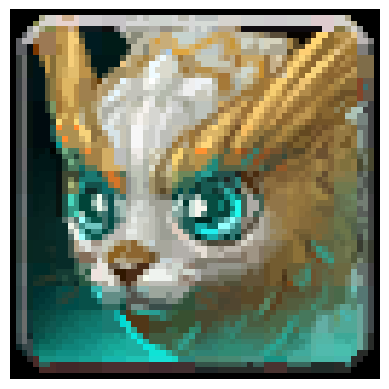

In [3]:
samples = []
for i in range(10):
    samples.append(exp.data.__iter__().__next__())

visualize_preprocessed_image(samples[0].numpy())

# Model Stats


In [4]:
from keras.layers import Conv2D, Conv2DTranspose
from keras import Sequential
from keras.src.engine.functional import Functional
from tensorflow_addons.layers import SpectralNormalization

def count_conv_layers(model):
    total_conv_layers = 0
    
    def _count_inside(layer):
        nonlocal total_conv_layers
        # print(type(layer))
        if isinstance(layer, Conv2D) or isinstance(layer, Conv2DTranspose) or isinstance(layer, SpectralNormalization):
            total_conv_layers += 1
        elif isinstance(layer, Sequential) or isinstance(layer, Functional):
            for sub_layer in layer.layers:
                _count_inside(sub_layer)
                
    _count_inside(model)
    return total_conv_layers

print("Total Generator TransposeConv Layers:", count_conv_layers(m.generator))
print("Total Disciminator Conv Layers:", count_conv_layers(m.discriminator))


Total Generator TransposeConv Layers: 64
Total Disciminator Conv Layers: 64


# Make a fake pokemon and judge it

<Figure size 640x480 with 0 Axes>

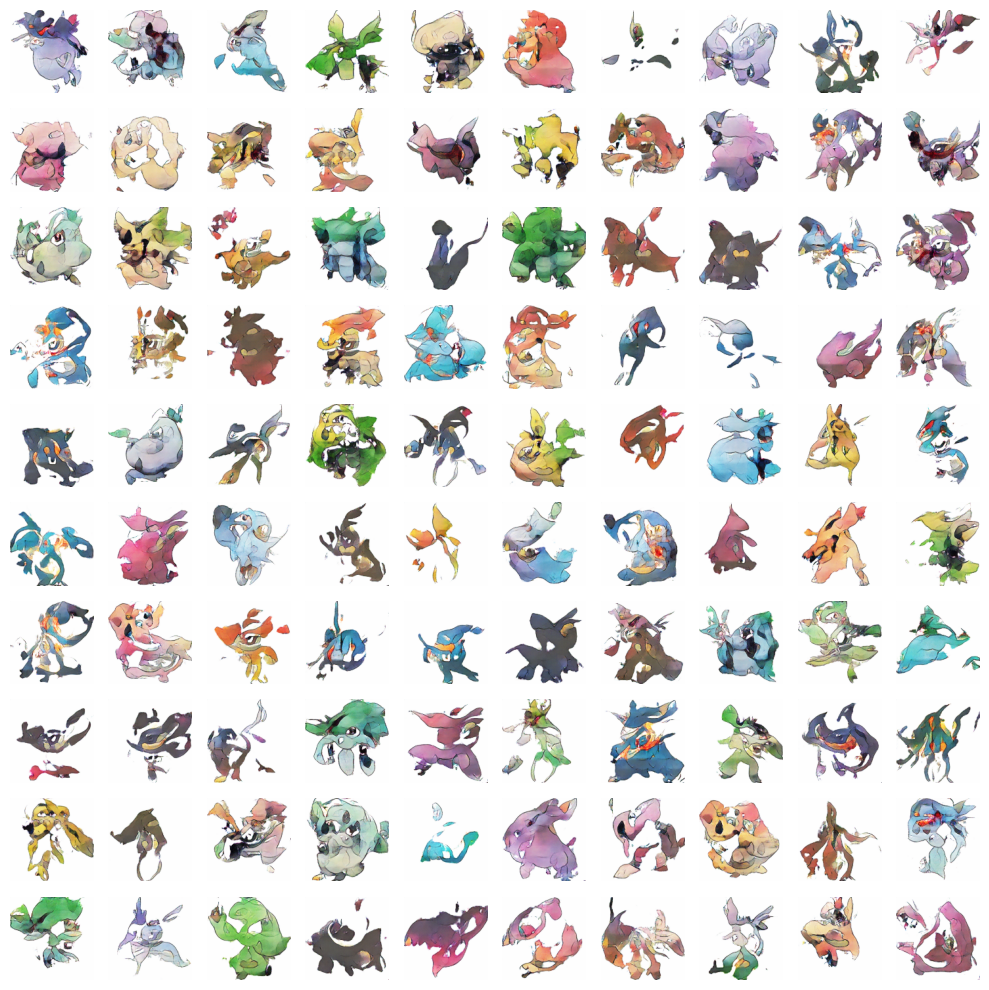

In [16]:
show_samples(m.generator, exp.get_params().latent_dim, rows=10, cols=10, file_name="tmp.jpg", dir="/tmp")

## Walk through the latent space

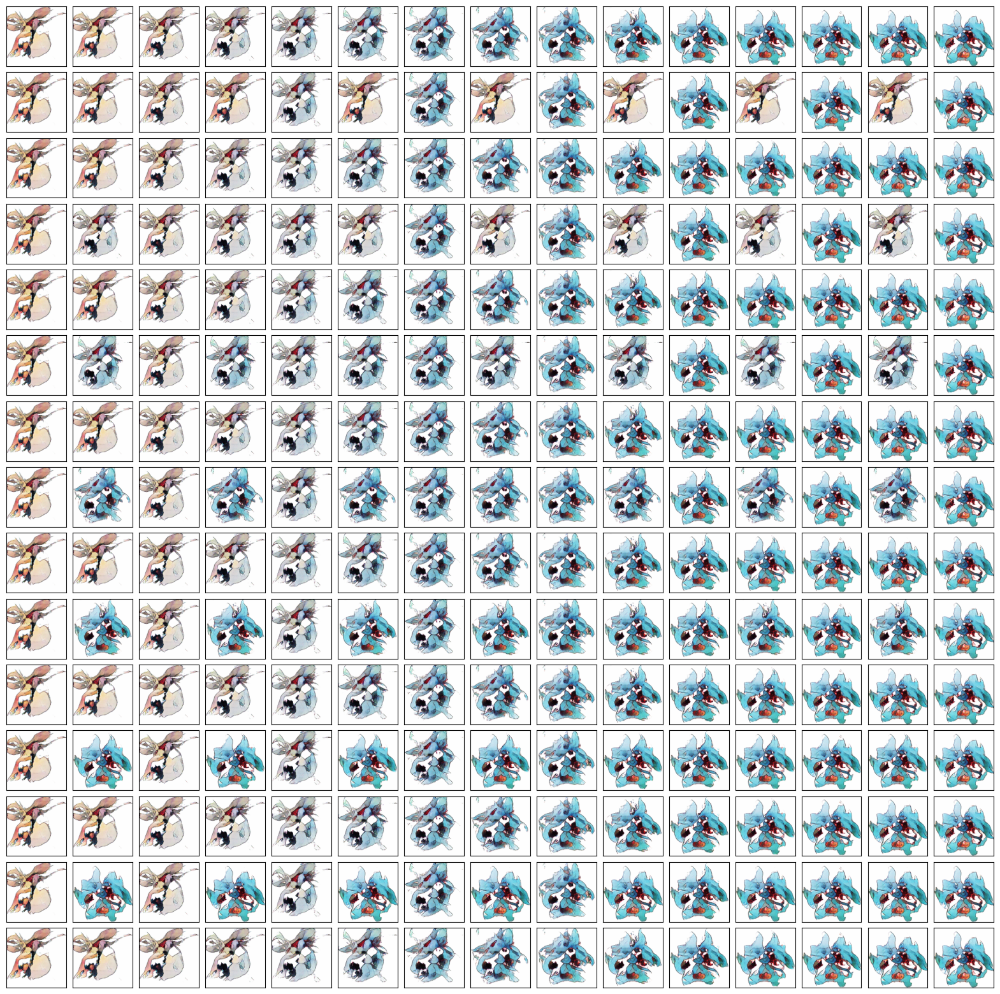

In [34]:
import numpy as np
import matplotlib.pyplot as plt

from thumbs.util import unnormalize_image

latent_dim = exp.params.latent_dim
grid_size = 15

start_points = np.random.normal(loc=-1, size=latent_dim)
end_points = np.random.normal(loc=1, size=latent_dim)

# start_points = np.zeros(latent_dim)
# end_points = np.ones(latent_dim) * 3


latent_grid = np.zeros((grid_size, grid_size, latent_dim))

for i in range(grid_size):
    for j in range(grid_size):
        alpha_i = i / (grid_size - 1)
        alpha_j = j / (grid_size - 1)
        for k in range(latent_dim):
            alpha_k = ((i * j) % 2) * alpha_i + (1 - ((i * j) % 2)) * alpha_j
            latent_grid[i, j, k] = (1 - alpha_k) * start_points[k] + alpha_k * end_points[k]

# Prepare a figure to hold the grid of images
fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20),
                         subplot_kw={'xticks': [], 'yticks': []},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i in range(grid_size):
    for j in range(grid_size):
        sample = np.expand_dims(latent_grid[i, j], axis=0)
        image = m.generator.predict(sample, verbose=0)  # Assuming this returns the image
        axes[i, j].imshow(unnormalize_image(image[0]))

plt.show()


1/1 [==============================] - 0s 31ms/step


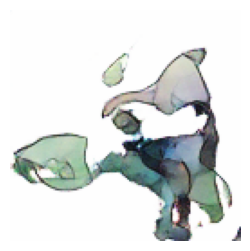

1/1 [==============================] - 0s 59ms/step
[[-34.732246]]


In [41]:

noise = np.random.normal(0, 1, (1, exp.params.latent_dim))
generated_thumbnails = m.generator.predict(noise)
visualize_preprocessed_image(generated_thumbnails[0], (3,3))
print(m.discriminator.predict(generated_thumbnails))


(1, 40)
(1, 1)
1/1 [==============================] - 0s 23ms/step


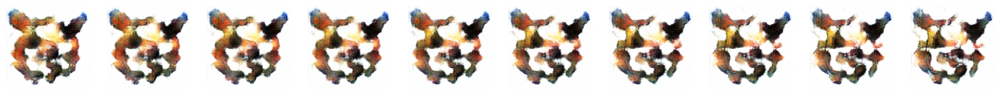

In [24]:
# n1 = noise
# drowsy = noise

from thumbs.util import unnormalize_image


def plot_images(images):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 4))
    for ax, img in zip(axes, images):
        ax.imshow(img)
        ax.axis('off') # Hide axes
    plt.show()

noise1 = np.random.normal(0, 1, (1, exp.params.latent_dim))
noise2 = np.random.normal(0, 1, (1, exp.params.latent_dim))

# Interpolate between both noises 
def interpolate_vectors(A, B, num_interpolations=8):
    alphas = np.linspace(0, 1, num_interpolations)
    return np.array([(1 - alpha) * A + alpha * B for alpha in alphas])

imgs = []
dex = np.expand_dims( np.array([362]), axis=0)
print(noise1.shape)
print(np.expand_dims( np.array([1]), axis=0).shape)
for noise in interpolate_vectors(noise1, noise2, 10):
    generated_thumbnails = m.generator.predict([ noise, dex ])
    imgs.append(unnormalize_image(generated_thumbnails[0]))


plot_images(imgs)

# visualize_preprocessed_image(generated_thumbnails[0], (3,3))


In [12]:
# mean of a lot of generated images
noise = np.random.normal(0, 1, (800, exp.get_params().latent_dim))
generated_thumbnails = m.generator.predict(noise)
print(np.mean(m.discriminator.predict(generated_thumbnails)))

25/25 [==============================] - 2s 81ms/step
-88.1726


# Determine attribution

In [21]:

# Define a function to compute the attribution maps using Gradient*Input method
def compute_attribution_map(image: np.ndarray):
    image = tf.convert_to_tensor(image)
    with tf.GradientTape() as tape:
        tape.watch(image)
        output = m.discriminator(image)
    
    gradients = tape.gradient(output, image)
    attribution_map = gradients * image
    
    return attribution_map

def show_attribution(input_image):
    preprocessed_image = np.expand_dims(input_image, axis=0)  # Add batch dimension

    # Compute the attribution map for the input image
    attribution_map = compute_attribution_map(preprocessed_image)
    # Convert the attribution map to a grayscale image
    attribution_map = np.mean(attribution_map, axis=-1, keepdims=True)

    # Normalize the attribution map to [0, 1]
    attribution_map -= np.min(attribution_map)
    attribution_map /= np.max(attribution_map)

    # Resize the attribution map to the original image size for visualization
    attribution_map = tf.image.resize(attribution_map, size=(128, 128)).numpy()


    # Convert them back to 0,255. The pokemon images look better that way, just keep
    # the attribution map consistent
    input_image = ((input_image + 1) * 127.5).astype(np.uint8)


    # Display the original image and the attribution map
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(input_image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    axes[1].imshow(attribution_map.squeeze(axis=0), cmap='bwr')
    axes[1].set_title('Attribution Map')
    axes[1].axis('off')
    plt.show()


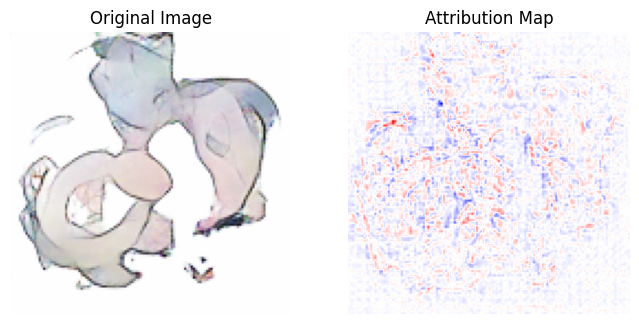

In [22]:

show_attribution(generated_thumbnails[0])

### Sanity check against an absurd image

1/1 [==============================] - 0s 24ms/step
[[-31.376331]]


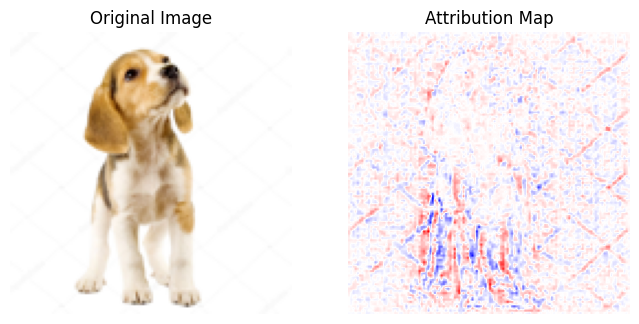

In [23]:
# load 
egg_jpg = '/home/anthony/windows/Downloads/dog_white.jpg'
egg = load_and_preprocess_image(egg_jpg, (128, 128, 3))

print(m.discriminator.predict(np.expand_dims(egg, axis=0)))
show_attribution(egg)

# Judge a real pokemon

Images in /home/anthony/workspace/yt-data/data/pokemon
['282-mega.jpg', '582.jpg', '340.jpg', '570.jpg', '136.jpg', '531-mega.jpg', '335.jpg', '96.jpg', '581.jpg', '153.jpg']
Found 821 total files
Found 819 jpgs


  0%|          | 0/819 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

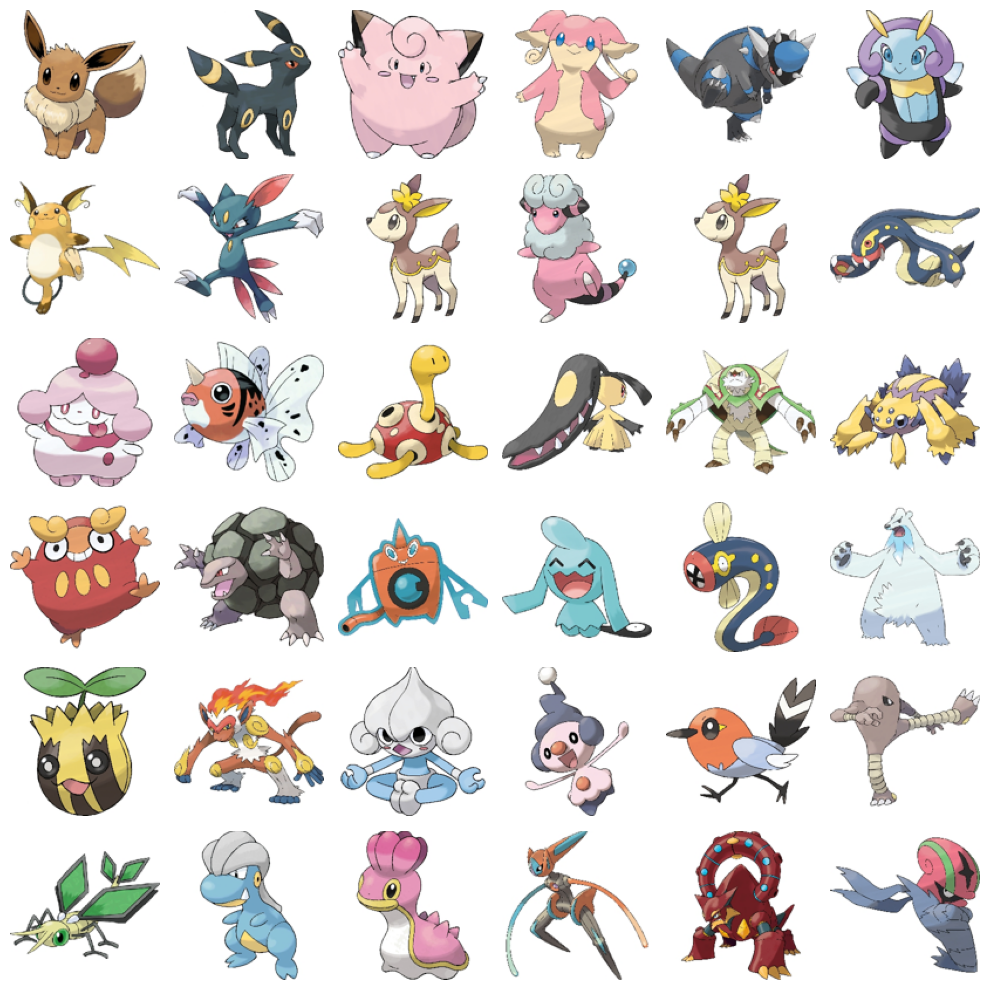

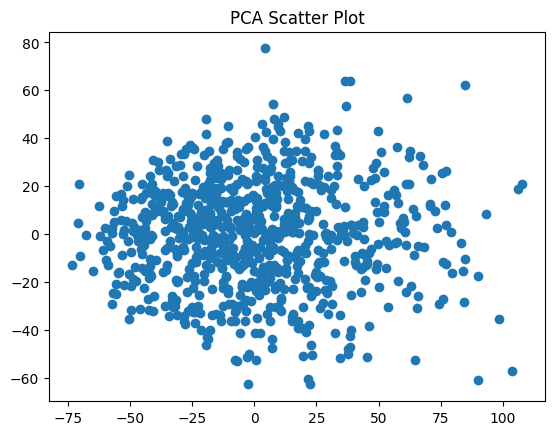

(819, 128, 128, 3)

In [4]:
from thumbs.data import get_pokemon_data256
images = get_pokemon_data256(exp.get_params().img_shape)
images.shape

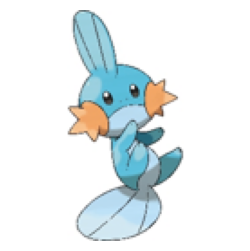

1/1 [==============================] - 0s 26ms/step
[[-29.83461]]


In [10]:
real_pokemon = images[np.random.randint(0, images.shape[0], 1)]
visualize_preprocessed_image(real_pokemon[0], (3,3))

print(m.discriminator.predict(real_pokemon))



In [11]:
# Get the average of all real pokemon
m.discriminator.predict(images).mean()

26/26 [==============================] - 2s 90ms/step


-19.088385

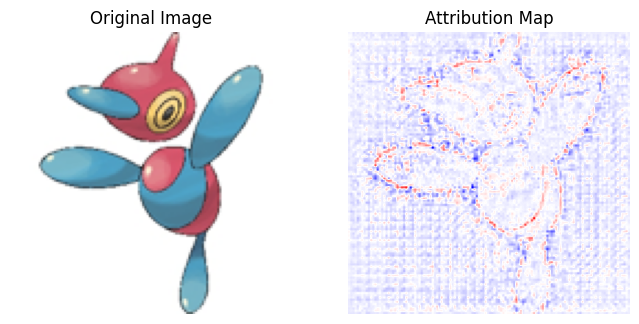

In [26]:

show_attribution(real_pokemon[0])

In [27]:

# Mean of the entire real set
print(np.mean(m.discriminator.predict(images)))

26/26 [==============================] - 2s 91ms/step
-20.022121


# Get FID score

In [48]:
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3
from scipy.linalg import sqrtm

def calculate_fid(model, images1, images2):
    # calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)

    # calculate mean and covariance statistics
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    # calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)

    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))

    # check and correct imaginary numbers from sqrt
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    # calculate score
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

In [29]:
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=exp.get_params().img_shape)

In [50]:
real_images = exp.data
fake_images = m.generator.predict(exp.params.latent_sample(real_images.shape[0]))
fid = calculate_fid(inception_model, real_images, fake_images)
fid

26/26 [==============================] - 3s 104ms/step


1048.3752560430144

# Inspect Generator hidden layer output

In [31]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

def get_intermediate_models(model):
    intermediate_models = []
    # layers_to_get = [2,5,8,11, 12]
    for i in range(len(model.layers)):
        # only pick models that have conv2d_transpose_1 or tanh in the name
        layer = model.layers[i]
        if 'conv2d' in layer.output.name.lower() or 'tanh' in layer.output.name.lower() or len(layer.output.shape) == 4:
            print(model.layers[i])
            intermediate_model = Model(inputs=model.input, outputs=model.layers[i].output)
            intermediate_models.append(intermediate_model)
    return intermediate_models


def inspect_layers(model, input):
    intermediate_models = get_intermediate_models(model)
    for i, intermediate_model in enumerate(intermediate_models):
        print(f'Layer {i+1} of {len(intermediate_models)}, shape {intermediate_model.output_shape}, name {intermediate_model.output.name}')
        intermediate_output = intermediate_model.predict(input, verbose=0)

        intermediate_output = intermediate_output[0]
        # n = 64
        # intermediate_output = intermediate_output[:, :, :n]

        intermediate_output -= intermediate_output.min() # Make the minimum 0
        intermediate_output /= intermediate_output.max() # Make the maximum 1

        n_cols = 4
        n_channels = min(n_cols, intermediate_output.shape[2])
        fig, axs = plt.subplots(n_channels , n_cols, figsize=(8, 8))
        for i in range(n_channels):
            for j in range(n_cols):
                if n_channels == 3:
                    axs[i][j].imshow(intermediate_output)
                else:
                    axs[i][j].imshow(intermediate_output[:, :, np.random.randint(0, intermediate_output.shape[2])])
                axs[i][j].axis('off')

        plt.show()



Layer 1 of 14, shape (None, 1, 1, 60), name reshape_1/Reshape:0


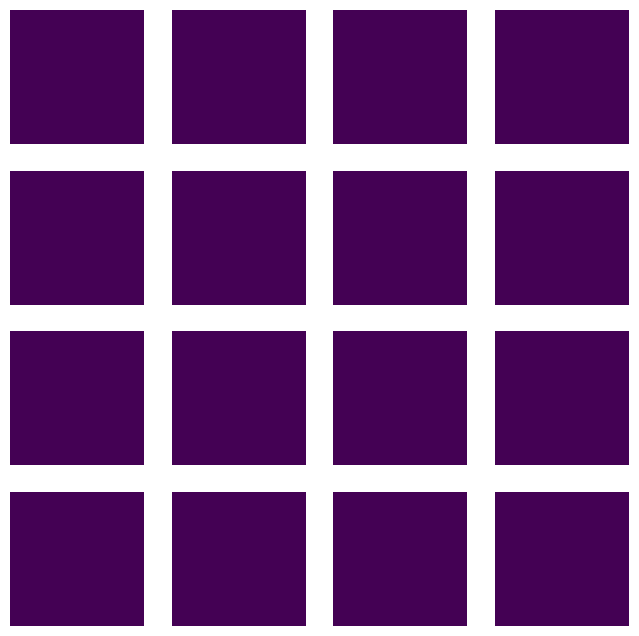

Layer 2 of 14, shape (None, 8, 8, 512), name conv2d_transpose_5/conv2d_transpose:0


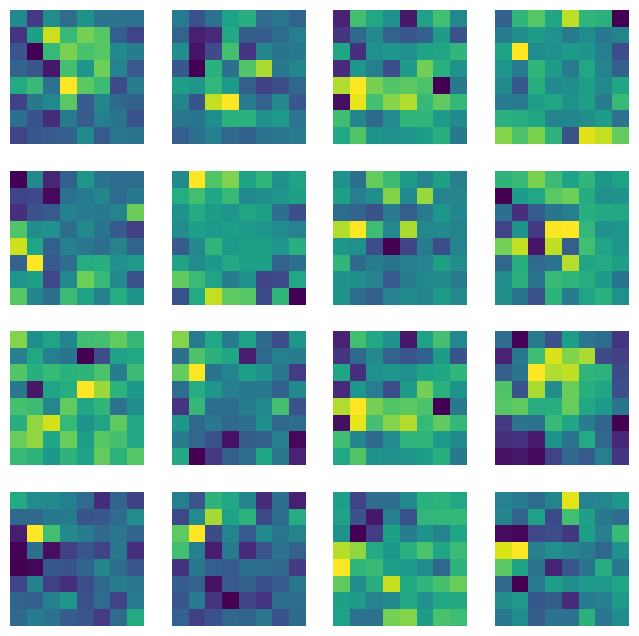

Layer 3 of 14, shape (None, 8, 8, 512), name layer_normalization_10/add:0


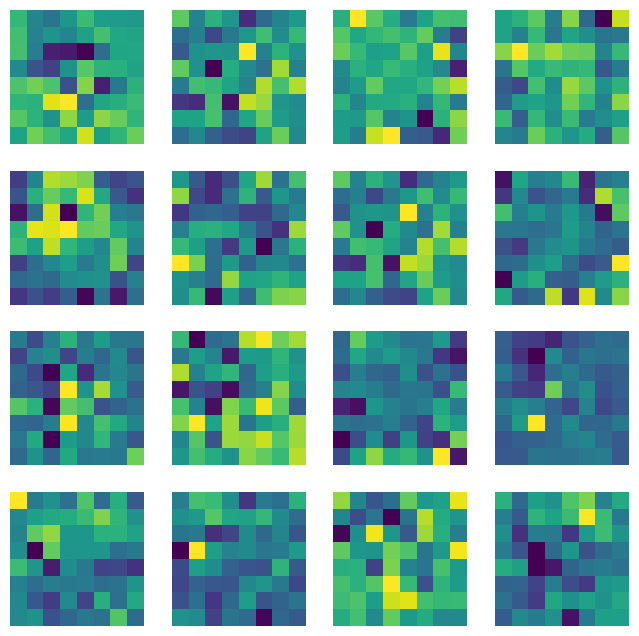

Layer 4 of 14, shape (None, 8, 8, 512), name leaky_re_lu_12/LeakyRelu:0


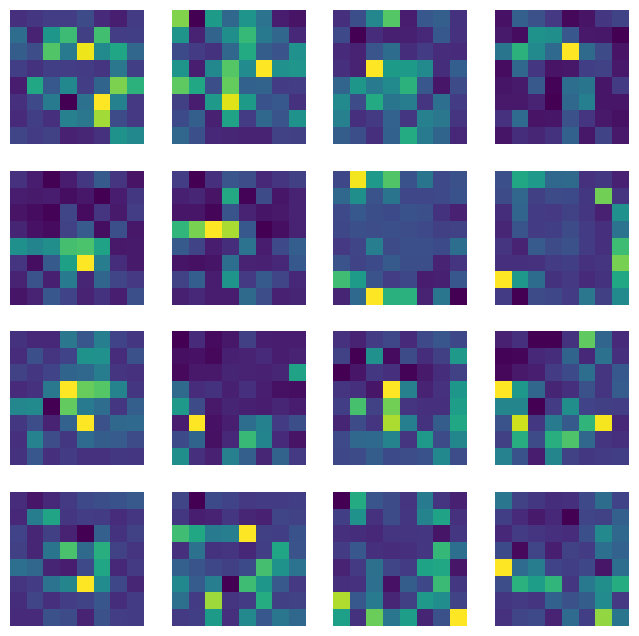

Layer 5 of 14, shape (None, 16, 16, 320), name conv2d_transpose_6/conv2d_transpose:0


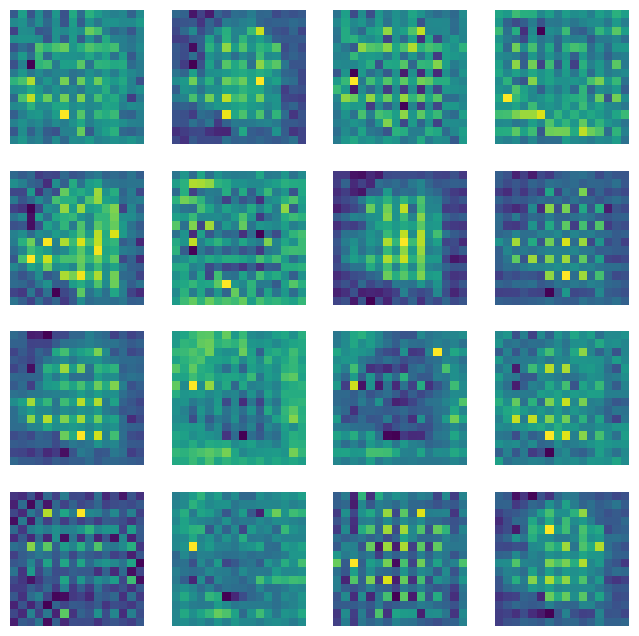

Layer 6 of 14, shape (None, 16, 16, 320), name layer_normalization_11/add:0


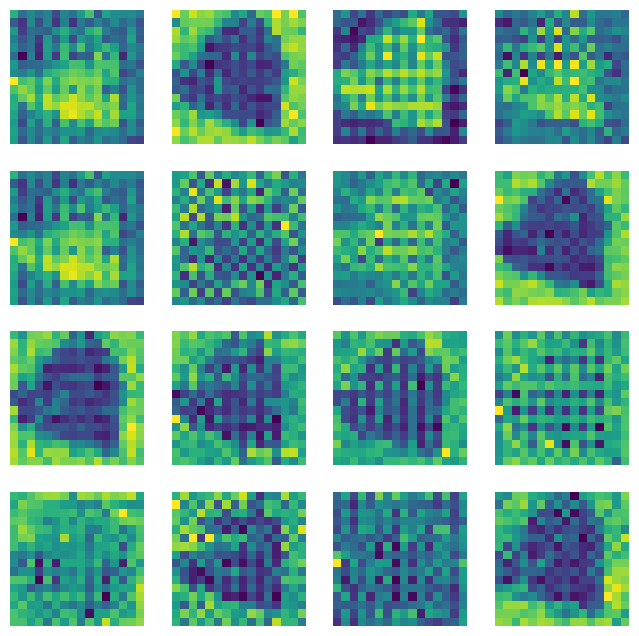

Layer 7 of 14, shape (None, 16, 16, 320), name leaky_re_lu_13/LeakyRelu:0


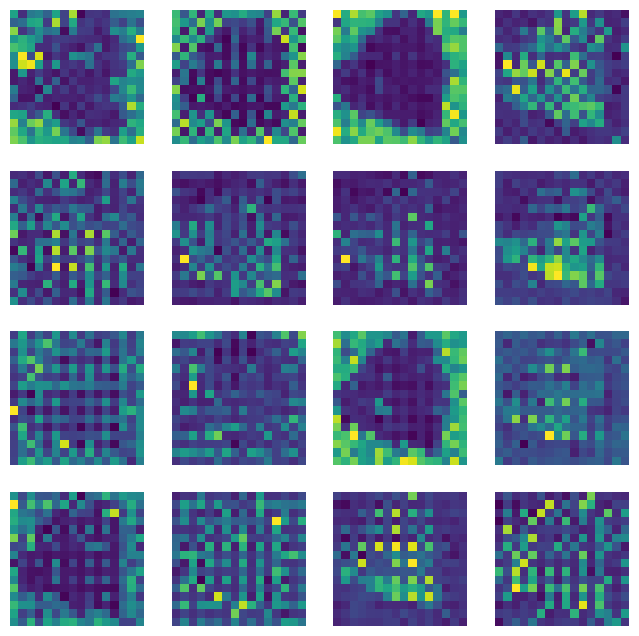

Layer 8 of 14, shape (None, 32, 32, 192), name conv2d_transpose_7/conv2d_transpose:0


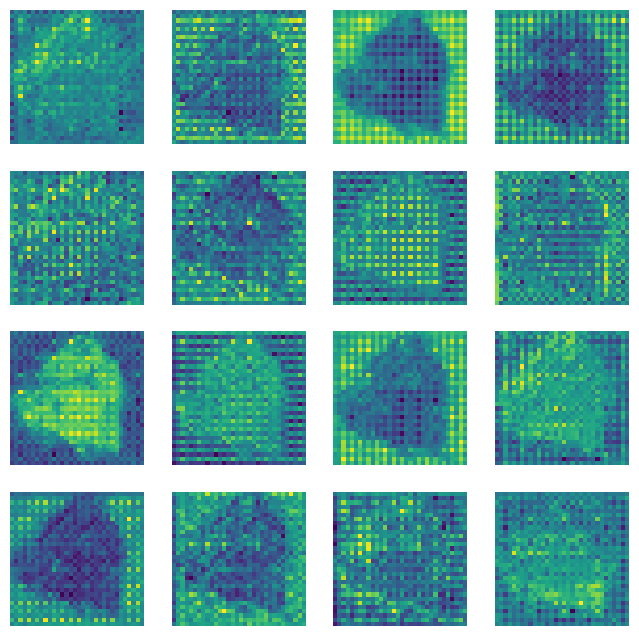

Layer 9 of 14, shape (None, 32, 32, 192), name layer_normalization_12/add:0


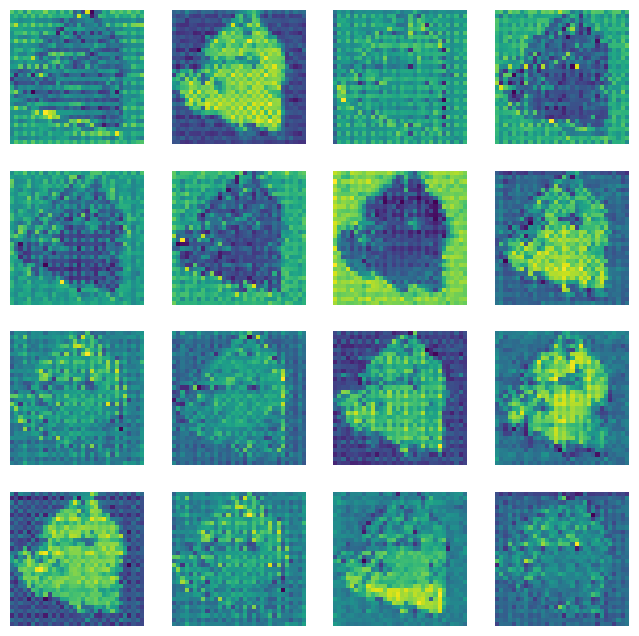

Layer 10 of 14, shape (None, 32, 32, 192), name leaky_re_lu_14/LeakyRelu:0


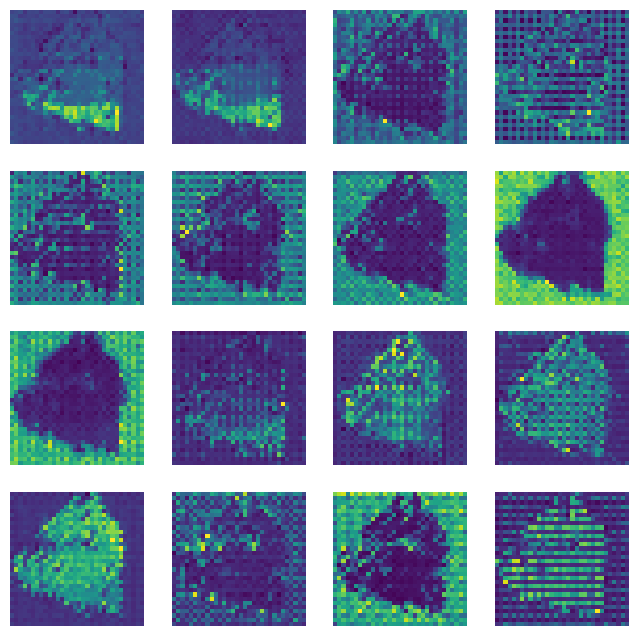

Layer 11 of 14, shape (None, 64, 64, 64), name conv2d_transpose_8/conv2d_transpose:0


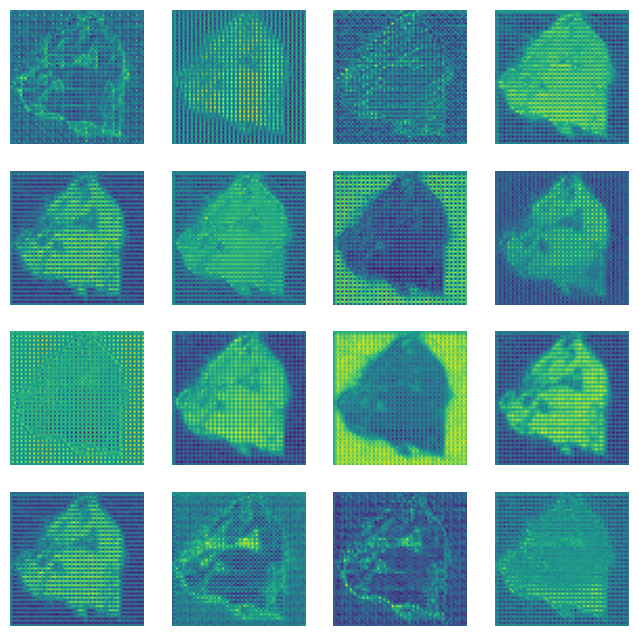

Layer 12 of 14, shape (None, 64, 64, 64), name layer_normalization_13/add:0


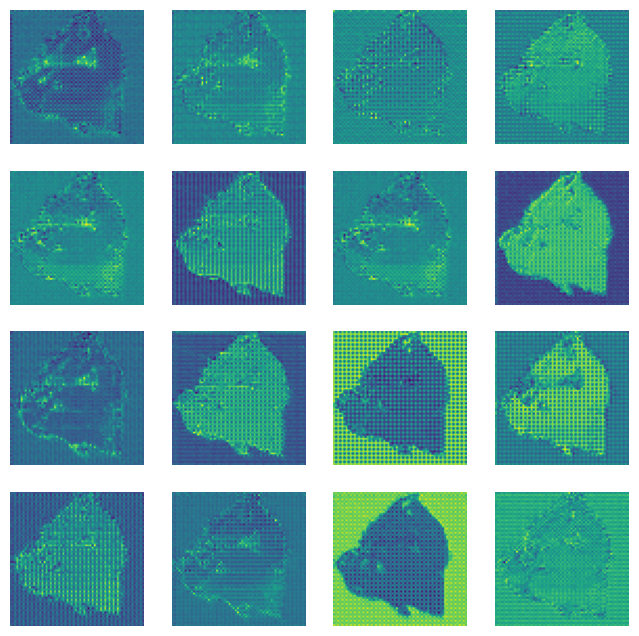

Layer 13 of 14, shape (None, 64, 64, 64), name leaky_re_lu_15/LeakyRelu:0


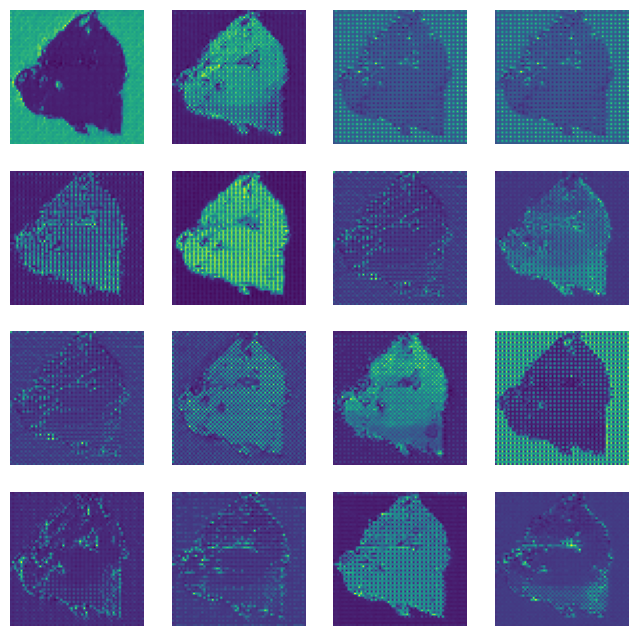

Layer 14 of 14, shape (None, 128, 128, 3), name conv2d_transpose_9/Tanh:0


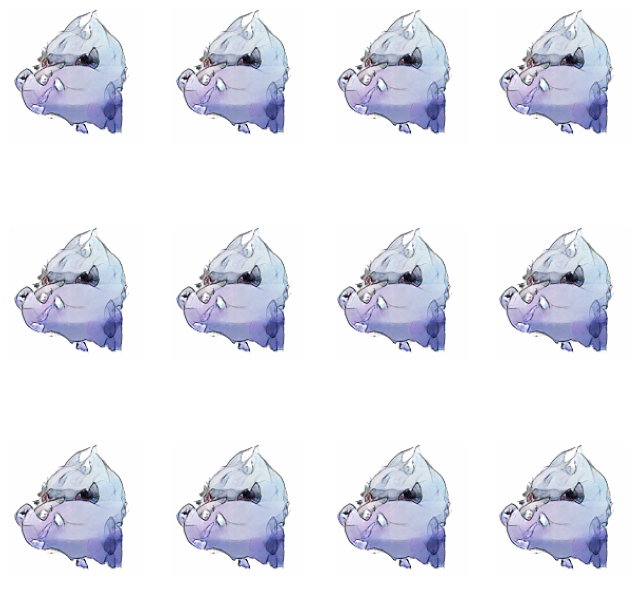

In [32]:

noise = np.random.normal(0, 1, (1, exp.params.latent_dim))
inspect_layers(m.generator, noise)

 # Inspect Discriminator hidden layers

In [33]:
noise = np.random.normal(0, 1, (1, 100))
generated_image = m.generator.predict(noise)
visualize_preprocessed_image(generated_image[0], (3,3))

inspect_layers(m.discriminator, generated_image)


InvalidArgumentError: Graph execution error:

Detected at node 'generator/reshape_1/Reshape' defined at (most recent call last):
    File "/usr/lib/python3.8/runpy.py", line 194, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.8/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/usr/lib/python3.8/asyncio/base_events.py", line 570, in run_forever
      self._run_once()
    File "/usr/lib/python3.8/asyncio/base_events.py", line 1859, in _run_once
      handle._run()
    File "/usr/lib/python3.8/asyncio/events.py", line 81, in _run
      self._context.run(self._callback, *self._args)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_2082/3911206034.py", line 2, in <module>
      generated_image = m.generator.predict(noise)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/training.py", line 2554, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/training.py", line 2341, in predict_function
      return step_function(self, iterator)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/training.py", line 2327, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/training.py", line 2315, in run_step
      outputs = model.predict_step(data)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/training.py", line 2283, in predict_step
      return self(x, training=False)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/training.py", line 569, in __call__
      return super().__call__(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/base_layer.py", line 1150, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/functional.py", line 512, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/functional.py", line 669, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/engine/base_layer.py", line 1150, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/keras/src/layers/reshaping/reshape.py", line 137, in call
      result = tf.reshape(inputs, (tf.shape(inputs)[0],) + self.target_shape)
Node: 'generator/reshape_1/Reshape'
Input to reshape is a tensor with 100 values, but the requested shape has 60
	 [[{{node generator/reshape_1/Reshape}}]] [Op:__inference_predict_function_56813]